Name | Matr.Nr. | Due Date
:--- | ---: | ---:
Darina Petrova | 12230205 | 22.01.2024, 08:00

<h1 style="color:rgb(0,120,170)">Hands-on AI I</h1>
<h2 style="color:rgb(0,120,170)">Unit 6 (Assignment) &ndash; Convolutional Neural Networks</h2>

<b>Authors:</b> Brandstetter, Schäfl, Schlüter, Rumetshofer, Schörgenhumer, Abbass<br>
<b>Date:</b> 08-01-2024

This file is part of the "Hands-on AI I" lecture material. The following copyright statement applies to all code within this file.

<b>Copyright statement:</b><br>
This material, no matter whether in printed or electronic form, may be used for personal and non-commercial educational use only. Any reproduction of this material, no matter whether as a whole or in parts, no matter whether in printed or in electronic form, requires explicit prior acceptance of the authors.

<h3 style="color:rgb(0,120,170)">How to use this notebook</h3>

This notebook is designed to run from start to finish. There are different tasks (displayed in <span style="color:rgb(248,138,36)">orange boxes</span>) which require your contribution (in form of code, plain text, ...). Most/All of the supplied functions are imported from the file <code>u6_utils.py</code> which can be seen and treated as a black box. However, for further understanding, you can look at the implementations of the helper functions. In order to run this notebook, the packages which are imported at the beginning of <code>u6_utils.py</code> need to be installed.

<div class="alert alert-warning">
    <b>Important:</b> When specifying a seed for the sources of randomness, use the <code>u6.set_seed(seed=XYZ)</code> function.
</div>

In [1]:
# Required packages and the u6_utils file
import u6_utils as u6
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import cv2
import torch

u6.check_module_versions()

# Set default plotting style.
sns.set()

# Setup Jupyter notebook (warning: this may affect all Jupyter notebooks running on the same Jupyter server).
u6.setup_jupyter()

Installed Python version: 3.10 (✓)
Installed numpy version: 1.25.2 (✓)
Installed pandas version: 2.0.3 (✓)
Installed scikit-learn version: 1.3.2 (✓)
Installed matplotlib version: 3.7.3 (✓)
Installed seaborn version: 0.12.2 (✓)
Installed torch version: 2.1.1+cu118 (✓)
Installed tqdm version: 4.66.1 (✓)
Installed cv2 version: 4.9.0 (✓)


/home/darina/Desktop/std/sem1/hands-on-AI-I/u6/u6_utils.py:31: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


<h2>Exercise 1</h2>

Similar to the Sobel filter presented in the lecture, apply two other operators (<b>Prewitt</b> and <b>Scharr</b>) to an image for the horizontal and the vertical approximations of the derivatives of the image intensity function. Perfom the following tasks:

<div class="alert alert-warning">
    <b>Exercise 1.1. [2 Points]</b>
    <ul>
        <li>Load a picture of a road (<code>lanes.jpg</code>), convert it to grayscale and plot the grayscale image to see what it looks like.</li>
    </ul>
</div>

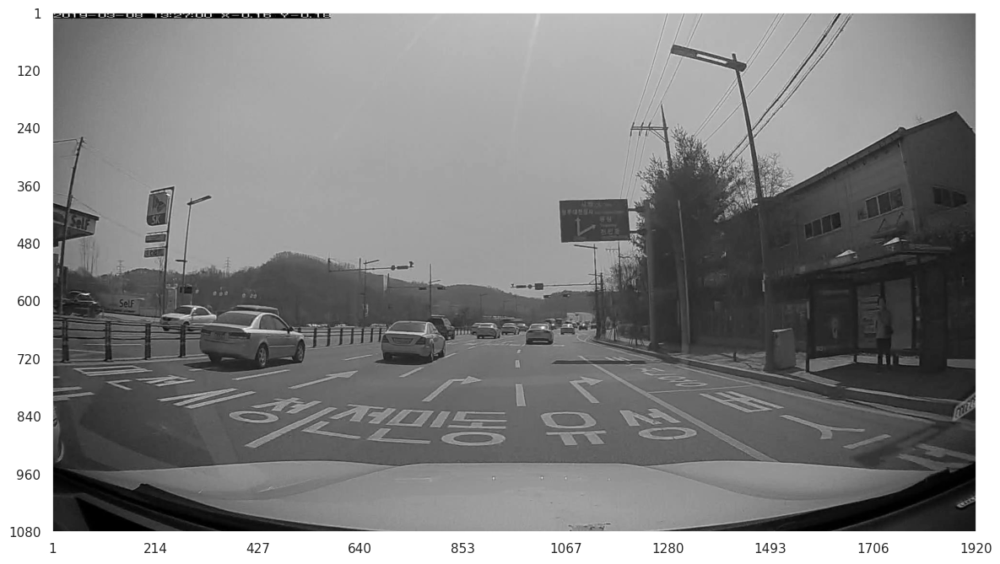

In [2]:
# your code goes here
image = plt.imread("resources/lanes.jpg")
image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
u6.show_image(image)

<div class="alert alert-warning">
    <b>Exercise 1.2. [2 Points]</b>
    <ul>
        <li>Define the two Prewitt operators as numpy arrays:

\begin{equation}P_x = \left[
    \begin{array}{rrr}                                
        1 & 0 & -1 \\
        1 & 0 & -1 \\
        1 & 0 & -1 \\
    \end{array}\right]
\end{equation}

\begin{equation}P_y = \left[
    \begin{array}{rrr}                                
        1 & 1 & 1 \\
        0 & 0 & 0 \\
        -1 & -1 & -1 \\
    \end{array}\right]
\end{equation}</li>
    </ul>
</div>

In [3]:
# your code goes here

prewitt_x = np.array([
    [ 1,  0,  -1],
    [ 1,  0,  -1],
    [ 1,  0,  -1]
])

prewitt_y = np.array([
    [ 1, 1, 1],
    [ 0, 0, 0],
    [-1,-1,-1]
])

<div class="alert alert-warning">
    <b>Exercise 1.3. [3 Points]</b>
    <ul>
        <li>Apply the two Prewitt operators $P_x$ and $P_y$ to the grayscale version of the above image and plot the results.</li>
    </ul>
</div>

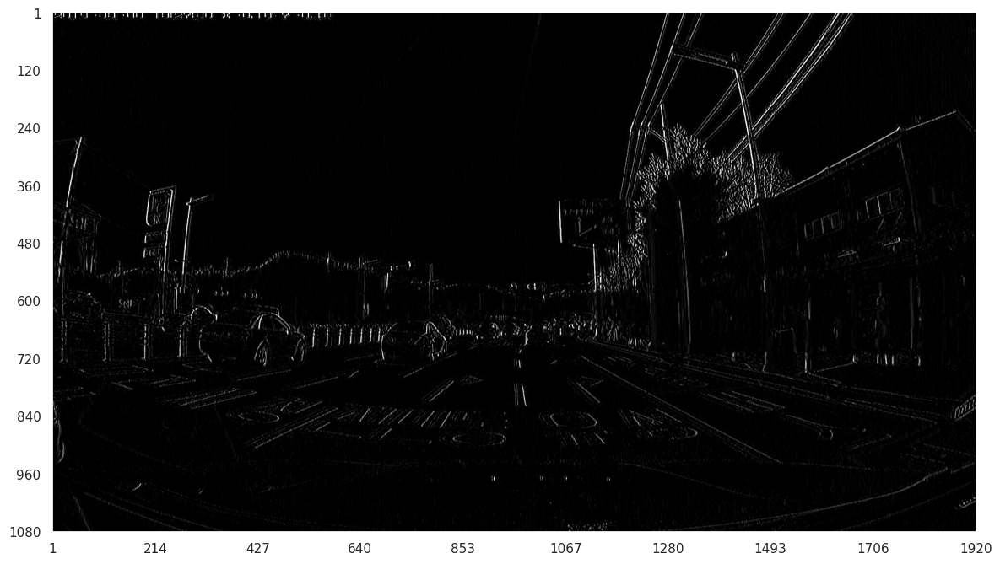

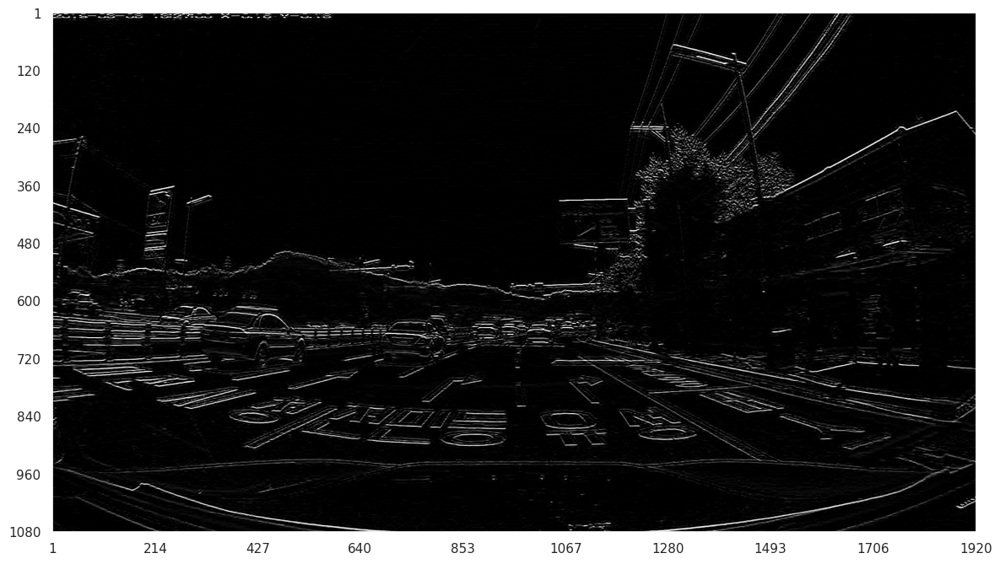

In [4]:
# your code goes here

filtered_image = cv2.filter2D(image, -1, prewitt_x)  # add [1:-1, 1:-1] to extract the unpadded data
u6.show_image(filtered_image)
filtered_image = cv2.filter2D(image, -1, prewitt_y)  # add [1:-1, 1:-1] to extract the unpadded data
u6.show_image(filtered_image)

<div class="alert alert-warning">
    <b>Exercise 1.4. [3 Points]</b>
    <ul>
        <li>Which parts of the resulting images above are highlighted? Do you observe any differences between the two Prewitt operators?</li>
    </ul>
</div>

The edges are highlighted. The first picture makes the vertical edges more visible, whereas the second - the horizontal.

<div class="alert alert-warning">
    <b>Exercise 1.5. [2 Points]</b>
    <ul>
        <li>Define the two Scharr operators as numpy arrays:

\begin{equation}S_x = \left[
    \begin{array}{rrr}                                
        47 & 0 & -47 \\
        162 & 0 & -162 \\
        47 & 0 & -47 \\
    \end{array}\right]
\end{equation}

\begin{equation}S_y = \left[
    \begin{array}{rrr}                                
        47 & 162 & 47 \\
        0 & 0 & 0 \\
        -47 & -162 & -47 \\
    \end{array}\right]
\end{equation}</li>
    </ul>
</div>

In [5]:
# your code goes here
scharr_x = np.array([
    [ 47,  0,  -47],
    [ 162,  0,  -162],
    [ 47,  0,  -47]
])

scharr_y = np.array([
    [ 47, 162, 47],
    [ 0, 0, 0],
    [-47,-162,-47]
])

<div class="alert alert-warning">
    <b>Exercise 1.6. [3 Points]</b>
    <ul>
        <li>Apply the two operators $S_x$ and $S_y$ to the grayscale version of the above image and plot the results.</li>
    </ul>
</div>

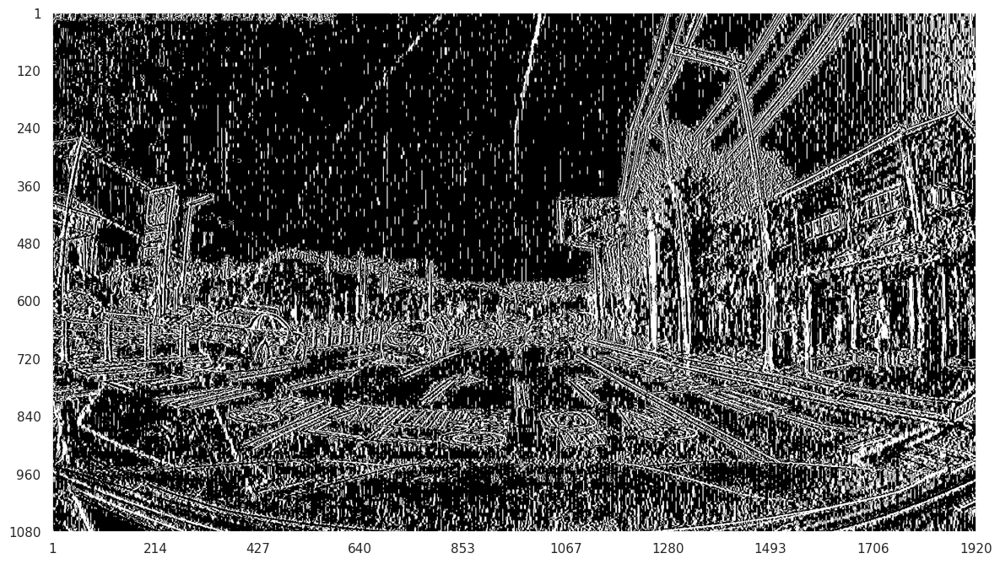

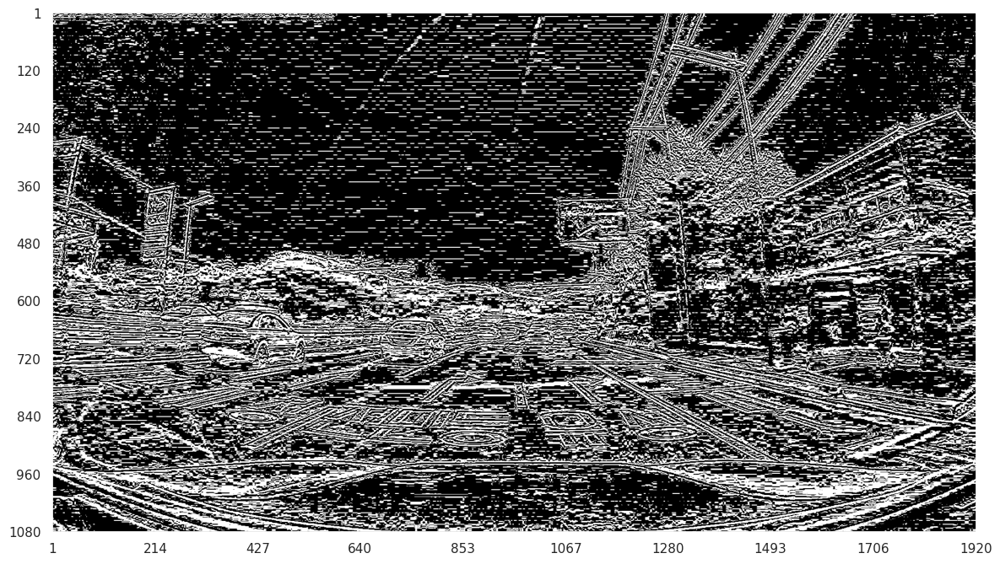

In [6]:
# your code goes here
filtered_image = cv2.filter2D(image, -1, scharr_x)  # add [1:-1, 1:-1] to extract the unpadded data
u6.show_image(filtered_image)
filtered_image = cv2.filter2D(image, -1, scharr_y)  # add [1:-1, 1:-1] to extract the unpadded data
u6.show_image(filtered_image)

<div class="alert alert-warning">
    <b>Exercise 1.7. [1 Points]</b>
    <ul>
        <li>Which parts of the resulting images above are highlighted? Do you observe any differences between the two Scharr operators?</li>
    </ul>
</div>

Again the edges, again the first highlight the vertical, and the second - horizontal.

<div class="alert alert-warning">
    <b>Exercise 1.8. [1 Points]</b>
    <ul>
        <li>Do you observe any differences between the Prewitt and the Scharr operators?</li>
    </ul>
</div>

Yes, the edges with the Scharr operator are much more intense, more of them get detected (even in places where they shouldn't really be). It's much more grainy (more pixels marked) than the smoother Prewitt result.

<div class="alert alert-warning">
    <b>Exercise 1.9. [5 Points]</b>
    <ul>
        <li>Define <b>two</b> operators (filters) $5 \times 5$ as numpy arrays (completely up to you).</li>
        <li>Load and display the image <code>TE250.jpg</code>.</li>
        <li>Apply your defined operators to the image <code>TE250.jpg</code> and <b>plot the results</b>.</li>
        <li>Hint: you don't need to convert (<code>TE250.jpg</code>) to grayscale.</li>
    </ul>
</div>

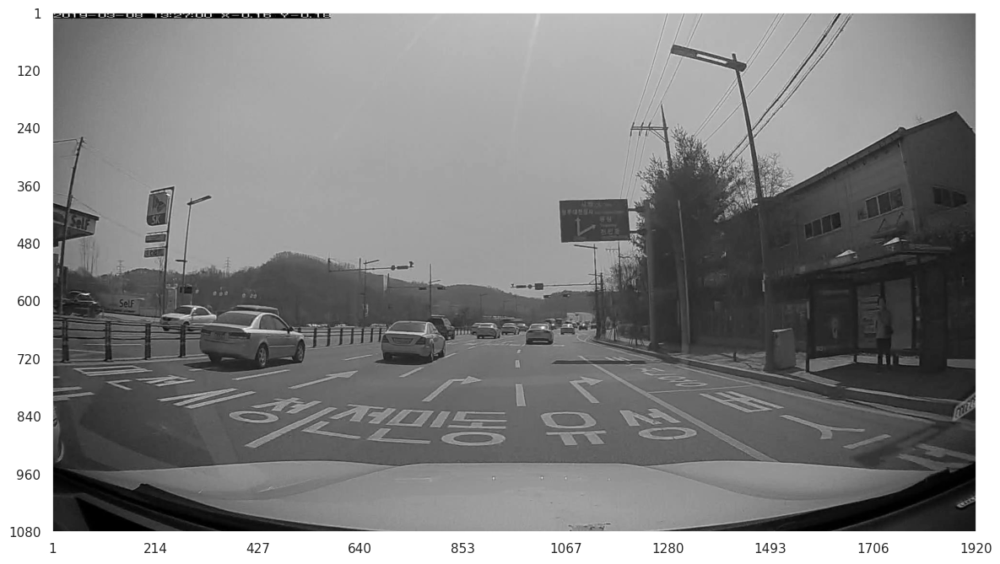

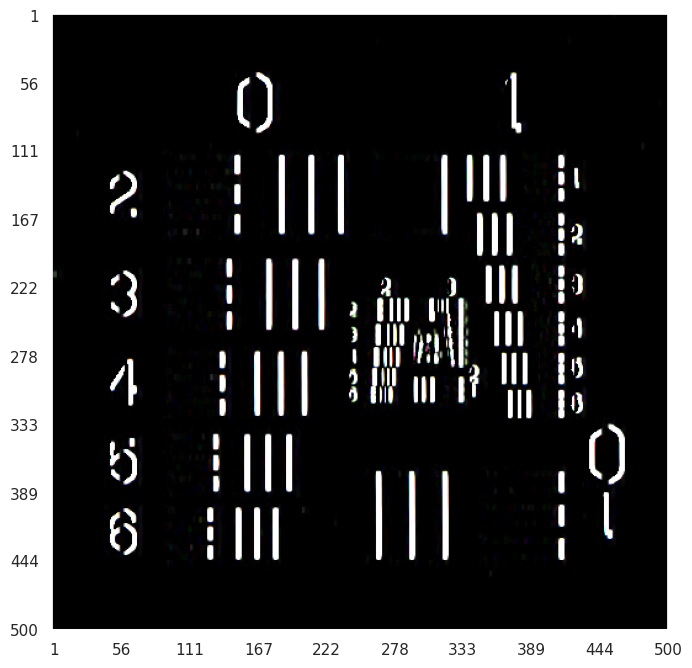

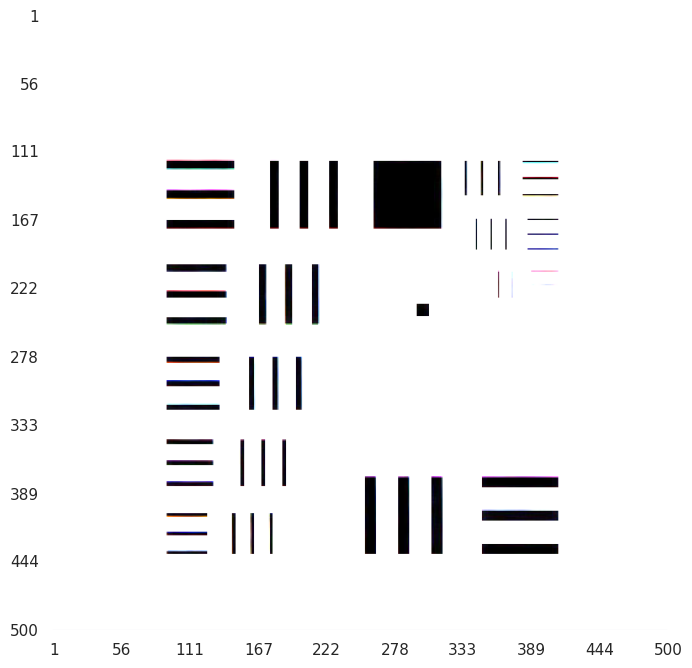

In [7]:
# your code goes here

operator1 = np.array([
    [-1, -1, 0, 1, 1],
    [-1, -1, 0, 1, 1],
    [-1, -1, 0, 1, 1],
    [-1, -1, 0, 1, 1],
    [-1, -1, 0, 1, 1]
])

operator2 = np.array([
    [1,  1,  1,  1, 1],
    [1,  0,  0,  0, 1],
    [1,  0,  -1, 0, 1],
    [1,  0,  0,  0, 1],
    [1,  1,  1,  1, 1]
])

image2 = plt.imread("resources/TE250.jpg")
u6.show_image(image)

filtered_image = cv2.filter2D(image2, -1, operator1)  # add [1:-1, 1:-1] to extract the unpadded data
u6.show_image(filtered_image)
filtered_image = cv2.filter2D(image2, -1, operator2)  # add [1:-1, 1:-1] to extract the unpadded data
u6.show_image(filtered_image)

<h2>Exercise 2</h2>

Up until now, custom filters were defined and applied on images, but as you certainly noticed, no neural network was involed so far. The gist of this exercise is to change that and get more insight into how <b>convolutional neural networks</b> operate. For this reason, perform the following tasks:

<div class="alert alert-warning">
    <b>Exercise 2.1. [4 Points]</b>
    <ul>
        <li>Define a custom filter as a numpy array:

\begin{equation}F = \left[
    \begin{array}{rrrrr}                                
        10 &   10 &  10 &   10 &  0 \\
        10 &  7.5 &   5 &    0 & -10 \\
        10 &    5 &   0 &   -5 & -10 \\
        10 &    0 &  -5 & -7.5 & -10 \\
        0 &   -10 & -10 &  -10 & -10
    \end{array}\right]
\end{equation}</li>
        <li>Create three additional copies of the custom filter and apply the following transformations: flip (reverse the order of all elements horizontally), rotation by $90$ degrees (counter clockwise), rotation by $90$ degrees (clockwise).</li>
        <li>Visualize all four filters.</li>
        <li>Hint: You can rotate a numpy array by $90$ degrees either counter clockwise or clockwise with <code>np.rot90(some_array)</code>, please read the following link for more details [Link text](https://numpy.org/doc/stable/reference/generated/numpy.rot90.html).</li>
        <li>Hint: You can $flip$ a numpy array with <code>np.flip(some_array)</code>, please read the following link for more details [Link text](https://numpy.org/doc/stable/reference/generated/numpy.flip.html).</li>
        <li>Hint: Your final array of filters should be of the form $\left[F, F_{flip}, F_{rot CounterClockwise }, F_{rot Clockwise}\right]$.</li>
    </ul>
</div>

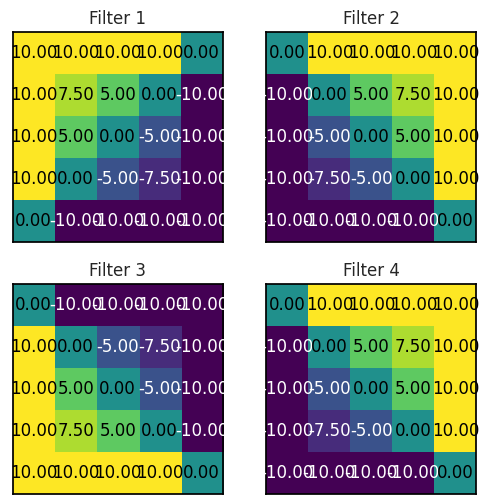

In [8]:
# your code goes here
F = np.array([
    [10, 10, 10, 10, 0],
    [10, 7.5, 5, 0, -10],
    [10, 5, 0, -5, -10],
    [10, 0, -5, -7.5, -10],
    [0, -10, -10, -10, -10]
])

F_flip = np.copy(F)
F_flip = np.flip(F_flip, axis=1) 
#this yields the same results as the clockwise rotation, if we wanted a different filter, we can flip it diagonally:
# F_flip = np.flip(F_flip) 

F_rot_counterwise = np.copy(F)
F_rot_counterwise = np.rot90(F_rot_counterwise, k=1)

F_rot_clockwise = np.copy(F)
F_rot_clockwise = np.rot90(F_rot_clockwise, k=3)

filters = np.array([F, F_flip, F_rot_counterwise, F_rot_clockwise])

u6.visualize_filters(filters)

<div class="alert alert-warning">
    <b>Exercise 2.2. [2 Points]</b>
    <ul>
        <li>Which structures do you think these filters might detect?</li>
    </ul>
</div>

Diagonal edges

<div class="alert alert-warning">
    <b>Exercise 2.3. [2 Points]</b>
    <ul>
        <li>Create and initialize a neural network of type <code>u6.InitializedNet</code> using the four filters.</li>
        <li>Use ReLU as activation function.</li>
    </ul>
</div>

In [9]:
# your code goes here
model = u6.InitializedNet(weights=filters, activation=torch.nn.ReLU())

<div class="alert alert-warning">
    <b>Exercise 2.4. [2 Points]</b>
    <ul>
        <li>Apply the neural network to the grayscale version of the image <code>lanes.jpg</code> to retrieve the layer outputs.</li>
        <li>In contrast to the previous tasks, use <code>get_grayscale_image_tensor</code> to load the image (again, <code>lanes.jpg</code>).</li>
    </ul>
</div>

In [10]:
# your code goes here
image_tensor = u6.get_grayscale_image_tensor(image)

conv_layer, activated_layer,  _  = model(image_tensor)

<div class="alert alert-warning">
    <b>Exercise 2.5. [2 Points]</b>
    <ul>
        <li>Plot the output of the convolutional layer and the output of the activation layer.</li>
    </ul>
</div>

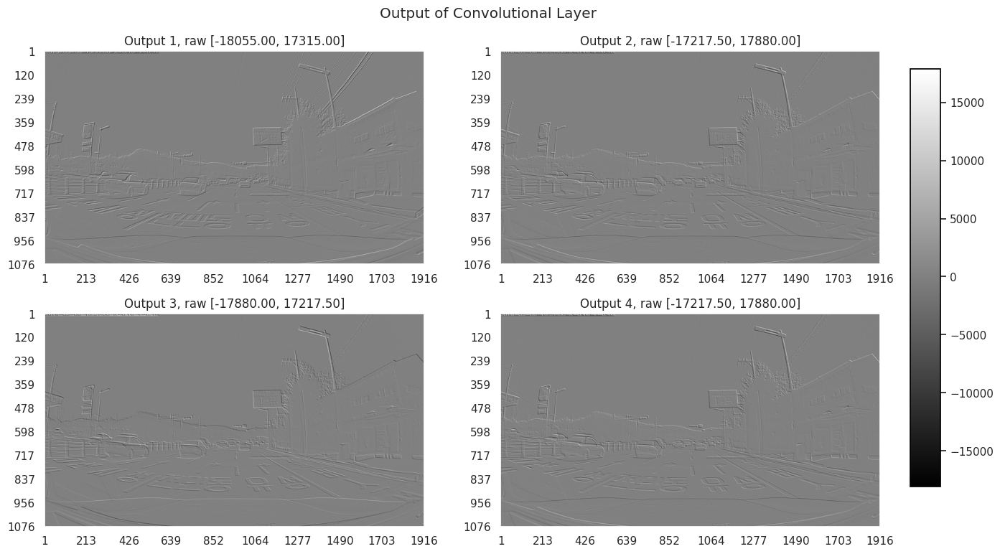

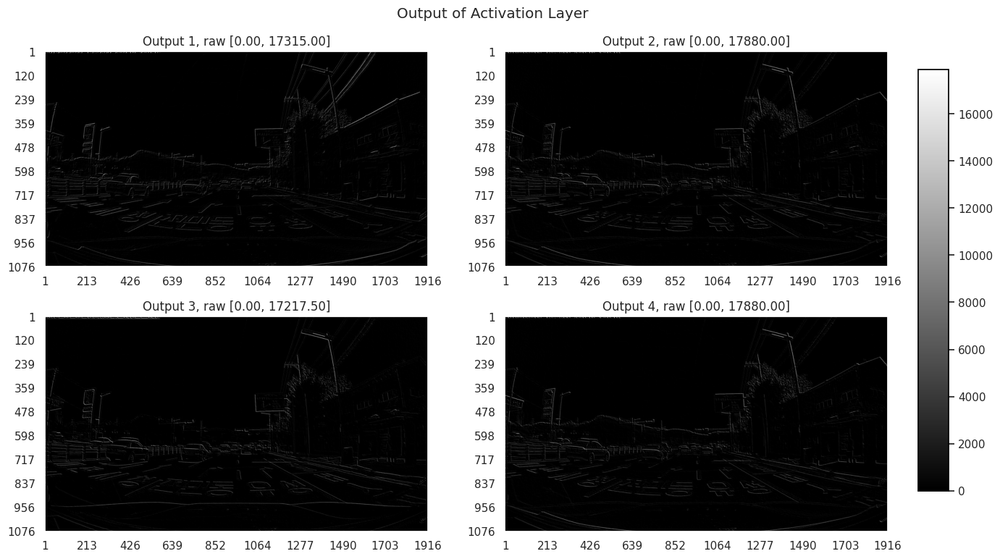

In [11]:
# your code goes here
u6.visualize_cnn_layer(conv_layer, title="Output of Convolutional Layer")
u6.visualize_cnn_layer(activated_layer, title="Output of Activation Layer")

<div class="alert alert-warning">
    <b>Exercise 2.6. [4 Points]</b>
    <ul>
        <li>Which parts of the image are highlighted? Do you observe any differences between the filters (with respect to each other) as well as between the two layers?</li>
    </ul>
</div>

Again the edges, this time diagonal edges like predicted. There are visible differences, to the human eye looking like shadows (making the pictures look concave or convex). Which diagonals are highlighted is most visible in the rectangle sign in the middle of the road, outputs 2 and 4 are the same, since the filters are the same. 

<h2>Exercise 3</h2>

In this exercise, we want to compare the output of a max pooling layer with the output of a strided convolution. Perform the following steps:

<div class="alert alert-warning">
    <b>Exercise 3.1. [4 Points]</b>
    <ul>
        <li>Create and initialize four neural networks of type <code>u6.InitializedNet</code> using the four filters from exercise 2.</li>
        <li>Use ReLU as activation function.</li>
        <li>Additionally, configure the following hyperparameters:</li>
        <ul>
            <li>Model 1: <b>max pooling</b> (parameter <code>max_pool_size</code>) with height/width = $3$, don't define a stride value.</li>
            <li>Model 2: <b>stride</b> (parameter <code>filter_stride</code>) = $3$, don't define a max pooling size.</li>
            <li>Model 3: <b>max pooling</b> with height/width = $7$, don't define a stride value.</li>
            <li>Model 4: <b>stride</b> = $7$, don't define a max pooling size.</li>
        </ul>
    </ul>
</div>

In [12]:
# your code goes here
model1 = u6.InitializedNet(weights=filters, activation=torch.nn.ReLU(), max_pool_size=(3, 3))  
model2 = u6.InitializedNet(weights=filters, activation=torch.nn.ReLU(), filter_stride=3)
model3 = u6.InitializedNet(weights=filters, activation=torch.nn.ReLU(), max_pool_size=(7, 7))
model4 = u6.InitializedNet(weights=filters, activation=torch.nn.ReLU(), filter_stride=7)

<div class="alert alert-warning">
    <b>Exercise 3.2. [4 Points]</b>
    <ul>
        <li>Apply the four neural networks to the grayscale version of the image above to retrieve the layer outputs.</li>
        <li>Use <code>get_grayscale_image_tensor</code> to load the image (again, <code>lanes.jpg</code>).</li>
    </ul>
</div>

In [13]:
# your code goes here
image_tensor = u6.get_grayscale_image_tensor(image)
conv_layer1, activated_layer1, pooling_layer1 = model1(image_tensor)
conv_layer2, activated_layer2, pooling_layer2 = model2(image_tensor)
conv_layer3, activated_layer3, pooling_layer3 = model3(image_tensor)
conv_layer4, activated_layer4, pooling_layer4 = model4(image_tensor)

<div class="alert alert-warning">
    <b>Exercise 3.3. [2 Points]</b>
    <ul>
        <li>Kernel size $3$ comparison: Plot the output of the max pooling layer of model 1 and the output of the activation layer of model 2.</li>
        <li>When plotting, set <code>clip=True</code>. This cuts off values larger than 255 to yield a more brighter looking output. Note that this is purely for visualization purposes, the original values in the CNN are unchanged.</li>
    </ul>
</div>

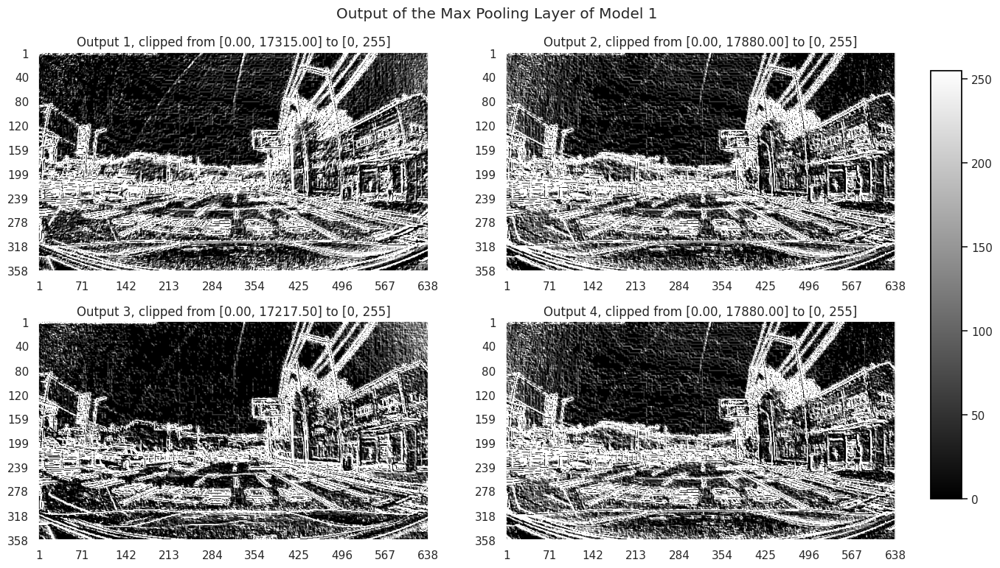

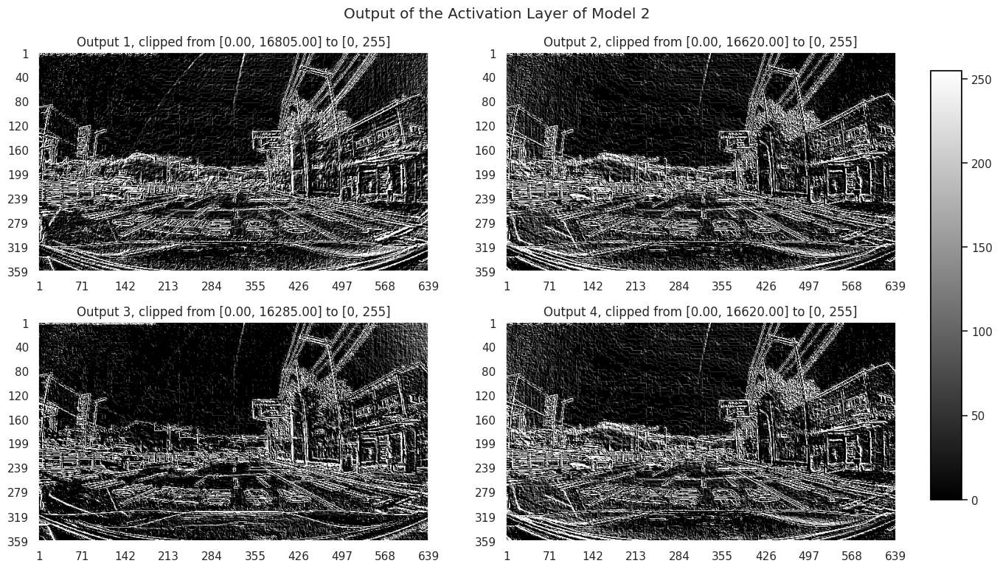

In [14]:
# your code goes here
u6.visualize_cnn_layer(pooling_layer1, clip=True, title="Output of the Max Pooling Layer of Model 1")
u6.visualize_cnn_layer(activated_layer2, clip=True,title="Output of the Activation Layer of Model 2")

<div class="alert alert-warning">
    <b>Exercise 3.4. [2 Points]</b>
    <ul>
        <li>Kernel size $7$ comparison: Plot the output of the max pooling layer of model 3 and the output of the activation layer of model 4.</li>
        <li>When plotting, set <code>clip=True</code>. This cuts off values larger than 255 to yield a more brighter looking output. Note that this is purely for visualization purposes, the original values in the CNN are unchanged.</li>
    </ul>
</div>

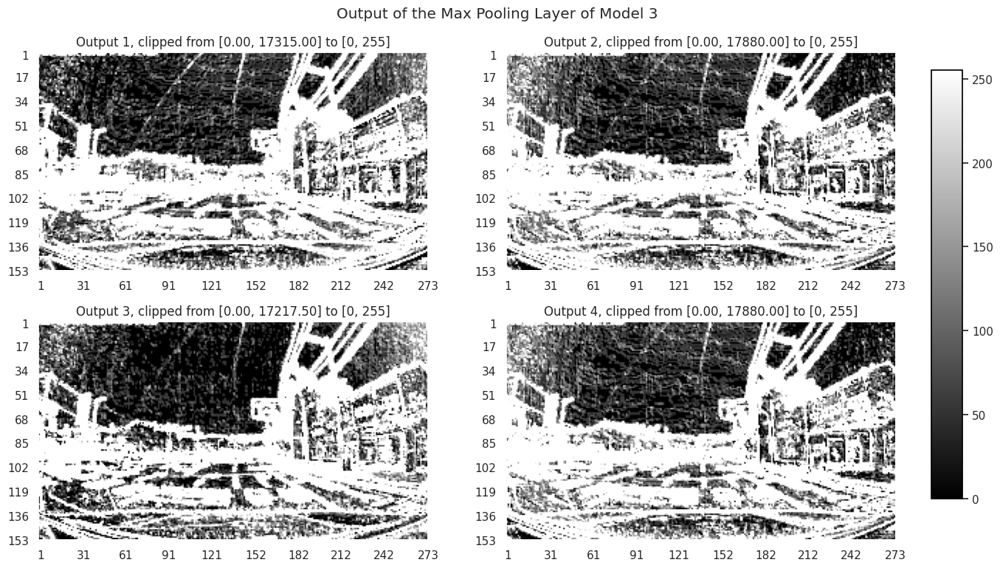

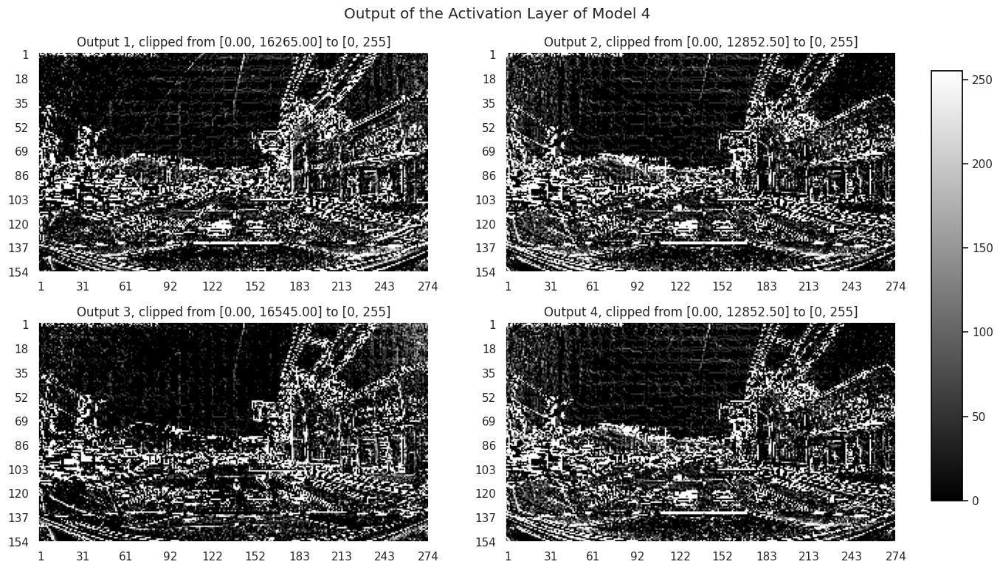

In [15]:
# your code goes here
u6.visualize_cnn_layer(pooling_layer3, clip=True, title="Output of the Max Pooling Layer of Model 3")
u6.visualize_cnn_layer(activated_layer4, clip=True,title="Output of the Activation Layer of Model 4")

<div class="alert alert-warning">
    <b>Exercise 3.5. [4 Points]</b>
    <ul>
        <li>Which parts of the image are highlighted? Do you observe any differences between striding and max pooling? Do you observe any differences between the two pooling sizes and the two stride values?</li>
    </ul>
</div>

Edges of the most prominent changes in intensity. The difference is that max pooling catches bigger edges, marking brighter (white) spots, the images are more 'readable'. As the pooling size and stride get bigger, the pictures get more pixelated, making it harder for us to distinguish what does the image show, loosing details.

<h2>Exercise 4</h2>

As you are now an expert in defining and applying custom kernels, we will now move on to learning kernels to create more expressive systems. 

Following the instruction given in the lecture notebook, perform the tasks below, but this time, using the <b>Street View House Numbers (SVHN)</b> dataset (more information about the dataset can be found here: http://ufldl.stanford.edu/housenumbers/).

To load the SVHN dataset and take a look at a preview of $10$ samples, run the cell below. The SVHN dataset contains RGB images with a resolution of $32 \times 32$ pixels from $10$ different classes. 

**Important:** The first time you run this, it will download the dataset. You may see a <code>UserWarning: The given NumPy array is not writeable</code>. This can be safely ignored. The download itself might take a couple of minutes.

**Important:** For reproducibility, set a fixed seed (seed=$23$).

Using downloaded and verified file: resources/train_32x32.mat
Using downloaded and verified file: resources/test_32x32.mat


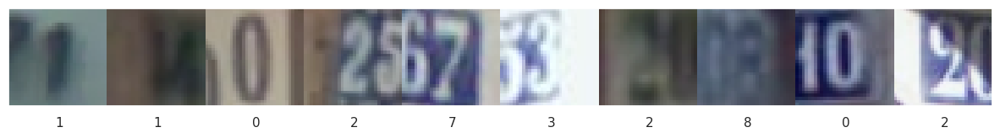

In [16]:
# load the dataset with custom batch size
train_loader, valid_loader, test_loader = u6.get_dataset(
    variant="SVHN",
    root="resources",
    batch_size=10,
    valid_size=0.1
)

# load the first batch of data (set seed for reproducibility)
u6.set_seed(23)
images, labels = next(iter(train_loader))
# transform the image shapes and normalize their values ([0, 1]) for visualization purposes
images = np.concatenate([img.squeeze() for img in images], axis=2).transpose(1, 2, 0)
images = (images - images.min()) / (images.max() - images.min())

# display the first batch of data
with plt.style.context({"axes.grid": False, "xtick.bottom": False}):
    plt.figure(figsize=(15, 2))
    plt.imshow(images)
    plt.xticks(16 + np.arange(len(labels)) * 32, labels.numpy())
    plt.yticks([])

<div class="alert alert-warning">
    <b>Exercise 4.1. [3 Points]</b>
    <ul>
        <li>Reload the SVHN dataset with a batch size of $32$ and considering $25\%$ of the samples as validation set.</li>
        <li>Show the first $16$ images from the first batch of the validation set</li>
    </ul>
</div>

Using downloaded and verified file: resources/train_32x32.mat
Using downloaded and verified file: resources/test_32x32.mat
torch.Size([32, 3, 32, 32])


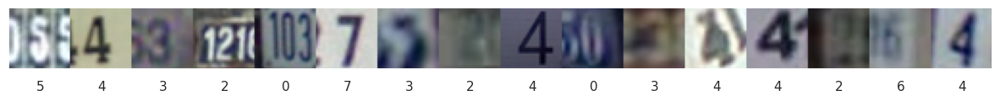

In [17]:
# your code goes here
u6.set_seed(seed=23)
train_loader, valid_loader, test_loader = u6.get_dataset(
    variant="SVHN",
    root="resources",
    batch_size=32,
    valid_size=0.25
)

u6.set_seed(seed=23)
images, labels = next(iter(valid_loader))
print(images.size())

images = images[:16]
labels = labels[:16]

images = np.concatenate([img.squeeze() for img in images], axis=2).transpose(1, 2, 0)
images = (images - images.min()) / (images.max() - images.min())

with plt.style.context({"axes.grid": False, "xtick.bottom": False}):
    plt.figure(figsize=(15, 2))
    plt.imshow(images)
    plt.xticks(16 + np.arange(len(labels)) * 32, labels.numpy())
    plt.yticks([])

<div class="alert alert-warning">
    <b>Exercise 4.2. [13 Points]</b>
    <ul>
        <li>Create and train a model according to the MNIST example provided in the notebook from the lecture. Keep the structure (ordering and number of layers) and hyperparameters if not stated otherwise. Change the model in a way that:</li>
        <ul>
            <li>it can process the RGB images from the SVHN dataset as input</li>
            <li>its convolutional layer applies kernels with size $5$ and outputs $16$ feature maps</li>
            <li>max pooling applies kernels with size $2$</li>
            <li>the number of inputs of the linear layer is adapted correctly after flattening the feature maps</li>
            <li>its first fully connected layer consists of $128$ neurons</li>
        </ul>
        <li>Define the loss function.</li>
        <li>Then, train the model with the following hyperparameters: iterations = $5$; momentum = $0.7$; and learning rate = $0.01$. Use the function <code>run_gradient_descent()</code> from <code>u6_utils.py</code>.</li>
        <li>For reproducibility, set a fixed seed (seed=23). It must be set both before defining the model and before the optimization (in which random samples are drawn). Otherwise, changes in the model would change the train/validation split samples, since both steps use randomization.</li>
    </ul>
</div>

In [18]:
# your code goes here
u6.set_seed(seed=23)

model = torch.nn.Sequential(
    torch.nn.Conv2d(in_channels=3, out_channels=16, kernel_size=5),  
    torch.nn.ReLU(),                                                 
    torch.nn.MaxPool2d(kernel_size=2),                               
    torch.nn.Flatten(),                                              
    torch.nn.Linear(16 * 14 * 14, 128),                                
    torch.nn.ReLU(),                                                 
    torch.nn.Linear(128, 10)                                         
)

loss = torch.nn.functional.cross_entropy

u6.set_seed(seed=23)

losses = u6.run_gradient_descent(
    model=model,
    loss=loss,
    training_set=train_loader,
    valid_set=valid_loader,
    iterations=5,
    learning_rate=0.01,
    momentum=0.7,
    use_cuda_if_available=True
)

  0%|          | 0/54942 [00:00<?, ?it/s]

Epoch  1 finished with training loss: 1.166980 and validation loss: 0.623355
Epoch  2 finished with training loss: 0.574413 and validation loss: 0.521963
Epoch  3 finished with training loss: 0.470625 and validation loss: 0.505194
Epoch  4 finished with training loss: 0.408214 and validation loss: 0.481151
Epoch  5 finished with training loss: 0.365360 and validation loss: 0.487545


<div class="alert alert-warning">
    <b>Exercise 4.3. [3 Points]</b>
    <ul>
        <li>Plot the training and validation losses and print the accuracy on the test set.</li>
    </ul>
</div>

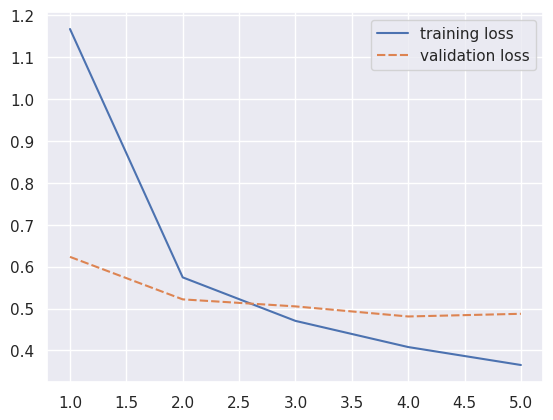

Test set accuracy: 0.8466886908420406


In [19]:
# your code goes here
sns.lineplot(data=losses)
plt.show()

tst = u6.evaluate_model(model, test_loader, loss=loss, accuracy=u6.multiclass_accuracy)
print(f"Test set accuracy: {tst['accuracy']}")

<div class="alert alert-warning">
    <b>Exercise 4.4. [2 Points]</b>
    <ul>
        <li>Plot the filters from the convolutional layer (layer 0).</li>
    </ul>
</div>

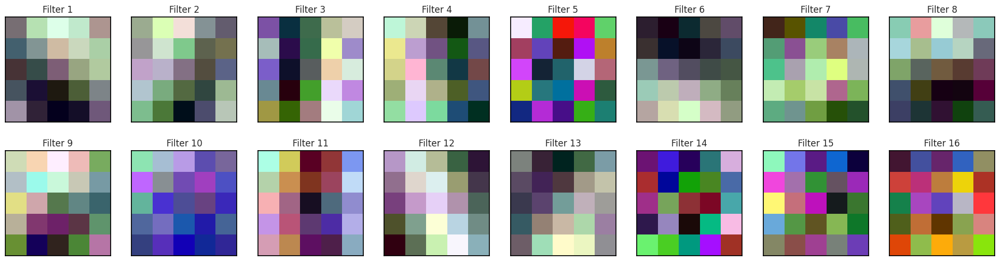

In [20]:
# your code goes here
u6.visualize_cnn_filters(model[0], ncols=8)

<div class="alert alert-warning">
    <b>Exercise 4.5. [2 Points]</b>
    <ul>
        <li>What kind of different structures (or textures) in an image might your CNN detect with these filters?</li>
    </ul>
</div>

Edges, lines and contrast - some filters have high contrast and gradients (like filter 1 might do well detecting diagonal edges). Color transitions, where filters have distinct color differences (like filters 14, 15, 16).

<h2>Exercise 5</h2>

<div class="alert alert-warning">
    <b>Exercise 5.1. [3 Points]</b>
    <ul>
        <li>Reload the SVHN dataset with $10\%$ validation data (the choice of other parameters is up to you).</li>
    </ul>
</div>

In [21]:
# your code goes here
u6.set_seed(seed=23)

train_loader, valid_loader, test_loader = u6.get_dataset(
    variant="SVHN",
    root="resources",
    batch_size=32,
    valid_size=0.1
)

Using downloaded and verified file: resources/train_32x32.mat
Using downloaded and verified file: resources/test_32x32.mat


<div class="alert alert-warning">
    <b>Exercise 5.2. [20 Points]</b>
    <ul>
        <li>Create a model similar to the model from exercise 4. The architecture design is completely up to you.</li>
        <li>Define the loss function.</li>
        <li>Train the model by using the function <code>run_gradient_descent()</code> from <code>u6_utils.py</code> and choose some appropriate hyperparameters.</li>
        <li>Can you optimize the model in order to achieve an accuracy on the test set > $88\%$? Plot the training and validation losses to show that your model does not overfit to the training data and print out the accuracy on the test to show that it is better than $88\%$.</li>
        <li>For optimization, you can vary several hyperparameters, e.g.: batch size, iterations, learning rate, momentum, number of layers, number of kernels/neurons, and type of non-linearity. Also different types of layers are allowed, e.g., <a href="https://pytorch.org/docs/stable/generated/torch.nn.Dropout.html"><code>torch.nn.Dropout()</code></a>. You may also try randomly flipping training images to perform data augmentation (provided by <code>u6.get_dataset()</code>). Do <b>not</b> vary the validation set size, as that would change the training set size.</li>
        <li>For reproducibility, set a fixed seed (seed=23). It must be set both before defining the model and before the optimization (in which random samples are drawn). Otherwise, changes in the model would change the train/validation split samples, since both steps use randomization.</li>
    </ul>
</div>

  0%|          | 0/65931 [00:00<?, ?it/s]

Epoch  1 finished with training loss: 1.050356 and validation loss: 0.503925
Epoch  2 finished with training loss: 0.490375 and validation loss: 0.399713
Epoch  3 finished with training loss: 0.400994 and validation loss: 0.374042
Epoch  4 finished with training loss: 0.345673 and validation loss: 0.346902


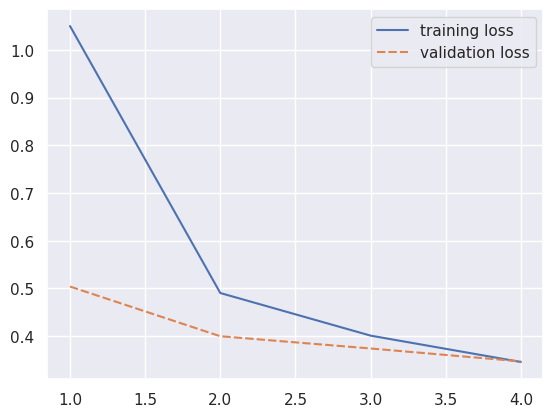

Test set accuracy: 0.8867547633681623


In [22]:
# your code goes here
u6.set_seed(seed=23)

model = torch.nn.Sequential(
    torch.nn.Conv2d(in_channels=3, out_channels=16, kernel_size=5),
    torch.nn.ReLU(),
    torch.nn.MaxPool2d(kernel_size=2),
    torch.nn.ReLU(),
    torch.nn.Conv2d(in_channels=16, out_channels=32, kernel_size=5),
    torch.nn.Flatten(),
    torch.nn.ReLU(),
    torch.nn.Linear(32 * 10 * 10, 500),
    torch.nn.ReLU(),
    torch.nn.Dropout(p=0.5),
    torch.nn.Linear(500, 10)
)

loss = torch.nn.functional.cross_entropy

u6.set_seed(seed=23)

losses = u6.run_gradient_descent(
    model=model,
    loss=loss,
    training_set=train_loader,
    valid_set=valid_loader,
    iterations=4,
    learning_rate=0.008,
    momentum=0.8,
    use_cuda_if_available=True
)

sns.lineplot(data=losses)
plt.show()

tst = u6.evaluate_model(model, test_loader, loss=loss, accuracy=u6.multiclass_accuracy)
print(f"Test set accuracy: {tst['accuracy']}")